<a href="https://colab.research.google.com/github/AArafatt/git/blob/main/AudioData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import wave
import scipy
from tqdm import tqdm_notebook

from keras import Sequential
from keras.utils import Sequence, to_categorical
from sklearn.preprocessing import LabelEncoder
from keras import losses, models, optimizers
from keras.activations import relu, softmax
from keras.layers import Convolution1D, Dense, Dropout, GlobalMaxPool1D, Input, MaxPool1D
from sklearn.metrics import confusion_matrix

%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import librosa
import IPython.display as ipd

x,sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav')
ipd.Audio(x, rate=sr)

In [ ]:
x,sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav')
ipd.Audio(x, rate=sr)

In [ ]:
x,sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/metal/metal.00000.wav')
ipd.Audio(x, rate=sr)

In [ ]:
!pip install pydub

# **Get general Information of the Audio**

In [ ]:
from pydub import AudioSegment

In [ ]:
#Load Files
audio_segment = AudioSegment.from_file('/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav')

# Print attributes
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Channels: 1
Sample width: 2
Frame rate (sample rate): 22050
Frame width: 2
Length (ms): 30013
Frame count: 661794.0
Intensity: -16.604916009774065


In [ ]:
audio_segment = AudioSegment.from_file('/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav')

#print attributes
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frtame rate(sample rate): {audio_segment.frame_rate}")
print(f"Length(ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Channels: 1
Sample width: 2
Frtame rate(sample rate): 22050
Length(ms): 30000
Frame count: 661504.0
Intensity: -13.760320791178772


In [ ]:
audio_segment = AudioSegment.from_file('/content/drive/MyDrive/Dataset/Data/genres_original/metal/metal.00000.wav')

#print attributes
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Channels: 1
Sample width: 2
Frame rate (sample rate): 22050
Frame width: 2
Length (ms): 30000
Frame count: 661504.0
Intensity: -18.604297431878848


# **Plotting Data**

In [ ]:
import librosa
audio_file_path = '/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav'
audio_data,sample_rate = librosa.load(audio_file_path)
audio_np_array = np.array(audio_data)
print(f"Sample rate: {sample_rate} Hz")

Sample rate: 22050 Hz


# For Rock

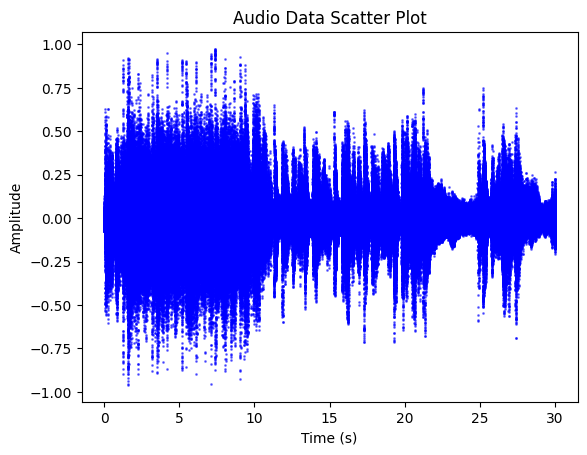

In [ ]:
audio_file_path = '/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav'
audio_data, sample_rate = librosa.load(audio_file_path)

# Generate time values based on audio duration
duration = len(audio_data) / sample_rate
time_values = np.linspace(0, duration, len(audio_data))

# Create the scatter plot
plt.scatter(time_values, audio_data, s=1, c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Audio Data Scatter Plot')

# Show the plot
plt.show()

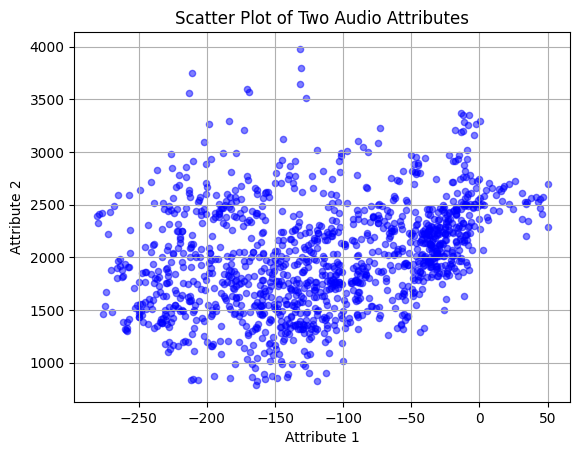

In [ ]:
audio_file_path = '/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav'
audio_data, sample_rate = librosa.load(audio_file_path)

import librosa.feature

# Compute MFCCs (example of one attribute)
mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate)

# Compute the spectral centroid (example of another attribute)
spectral_centroid = librosa.feature.spectral_centroid(y=audio_data, sr=sample_rate)

attribute1 = mfccs[0]  # Replace with the specific MFCC index you want to plot
attribute2 = spectral_centroid[0]

# Create the scatter plot
plt.scatter(attribute1, attribute2, s=20, c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Attribute 1')
plt.ylabel('Attribute 2')
plt.title('Scatter Plot of Two Audio Attributes')

# Show the plot
plt.grid(True)
plt.show()

Pop

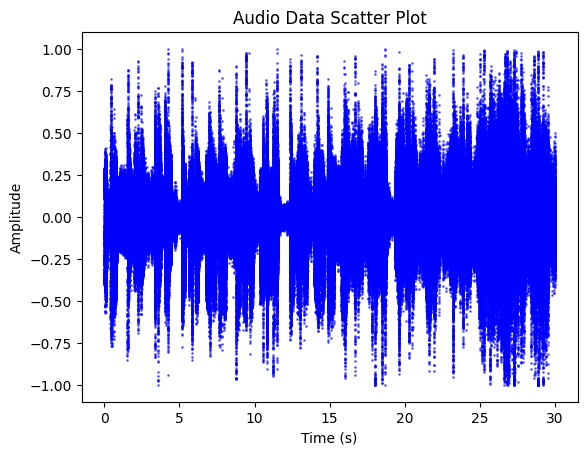

In [ ]:
audio_file_path = '/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav'
audio_data, sample_rate = librosa.load(audio_file_path)

# Generate time values based on audio duration
duration = len(audio_data) / sample_rate
time_values = np.linspace(0, duration, len(audio_data))

# Create the scatter plot
plt.scatter(time_values, audio_data, s=1, c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Audio Data Scatter Plot')

# Show the plot
plt.show()

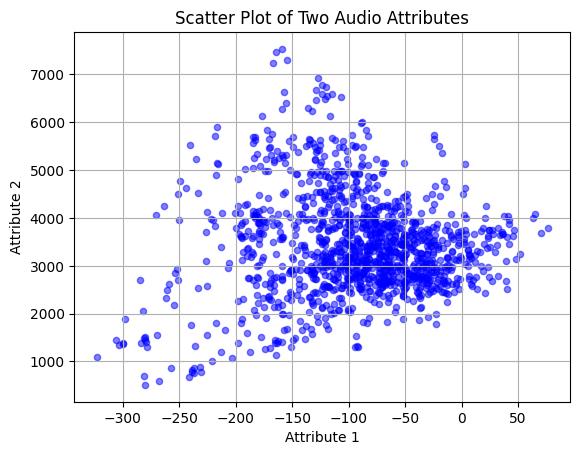

In [ ]:
audio_file_path = '/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav'
audio_data, sample_rate = librosa.load(audio_file_path)

import librosa.feature

# Compute MFCCs (example of one attribute)
mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate)

# Compute the spectral centroid (example of another attribute)
spectral_centroid = librosa.feature.spectral_centroid(y=audio_data, sr=sample_rate)

attribute1 = mfccs[0]  # Replace with the specific MFCC index you want to plot
attribute2 = spectral_centroid[0]

# Create the scatter plot
plt.scatter(attribute1, attribute2, s=20, c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Attribute 1')
plt.ylabel('Attribute 2')
plt.title('Scatter Plot of Two Audio Attributes')

# Show the plot
plt.grid(True)
plt.show()

Metal

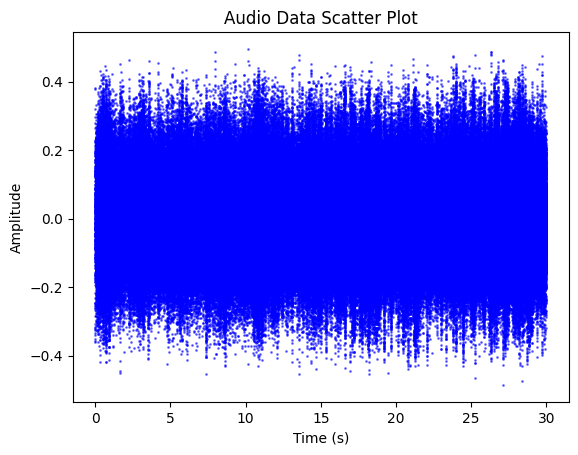

In [ ]:
audio_file_path = '/content/drive/MyDrive/Dataset/Data/genres_original/metal/metal.00000.wav'
audio_data, sample_rate = librosa.load(audio_file_path)

# Generate time values based on audio duration
duration = len(audio_data) / sample_rate
time_values = np.linspace(0, duration, len(audio_data))

# Create the scatter plot
plt.scatter(time_values, audio_data, s=1, c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Audio Data Scatter Plot')

# Show the plot
plt.show()

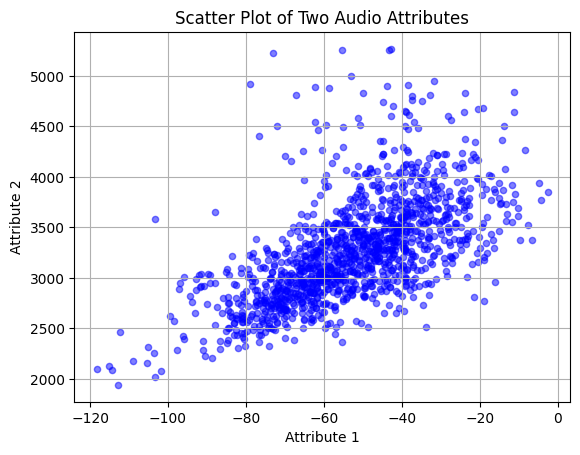

In [ ]:
audio_file_path = '/content/drive/MyDrive/Dataset/Data/genres_original/metal/metal.00000.wav'
audio_data, sample_rate = librosa.load(audio_file_path)

import librosa.feature

# Compute MFCCs (example of one attribute)
mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate)

# Compute the spectral centroid (example of another attribute)
spectral_centroid = librosa.feature.spectral_centroid(y=audio_data, sr=sample_rate)

attribute1 = mfccs[0]  # Replace with the specific MFCC index you want to plot
attribute2 = spectral_centroid[0]

# Create the scatter plot
plt.scatter(attribute1, attribute2, s=20, c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Attribute 1')
plt.ylabel('Attribute 2')
plt.title('Scatter Plot of Two Audio Attributes')

# Show the plot
plt.grid(True)
plt.show()

# **First Fourier Transformation**

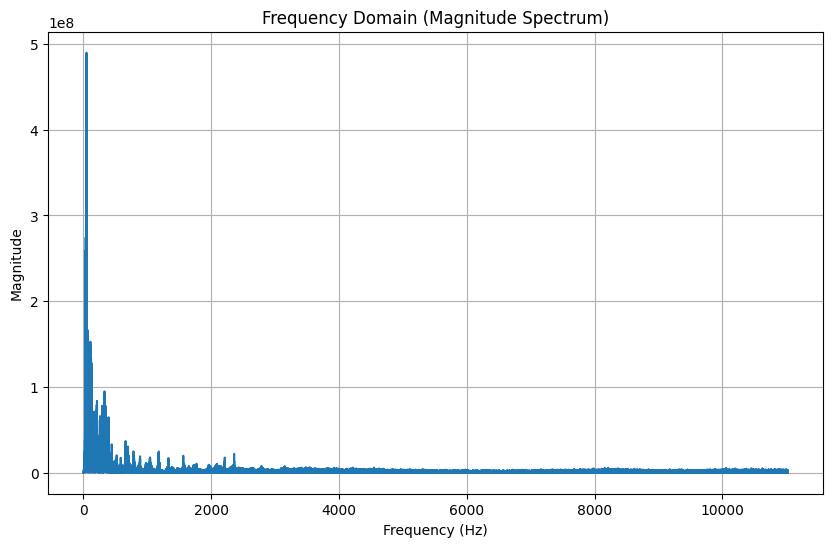

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile

# Load an audio file
audio_file = '/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav'
sample_rate, audio_data = wavfile.read(audio_file)

# Perform FFT
n = len(audio_data)
freq_data = np.fft.fft(audio_data)
freq_data = np.abs(freq_data)[:n // 2]

# Frequency values
frequencies = np.fft.fftfreq(n, 1 / sample_rate)
frequencies = frequencies[:n // 2]

# Plot the magnitude spectrum
plt.figure(figsize=(10, 6))
plt.plot(frequencies, freq_data)
plt.title('Frequency Domain (Magnitude Spectrum)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.show()


# **Wave form**

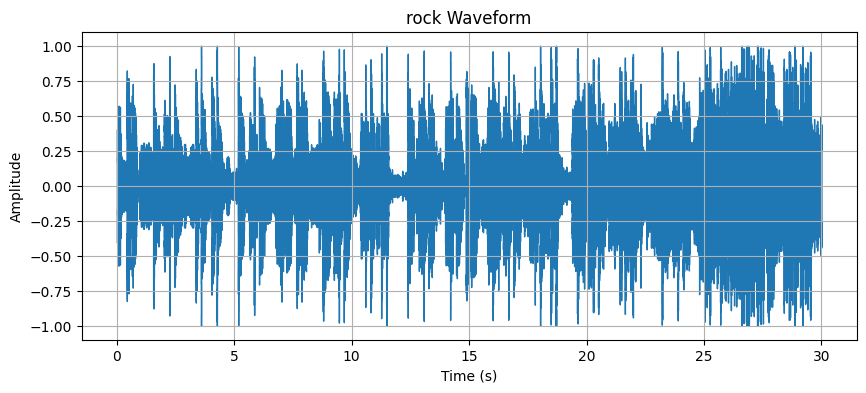

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load an audio file
audio_file = '/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav'
y, sr = librosa.load(audio_file)

# Display the waveform
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('rock Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()


# **Short Time Fourier Transformation**

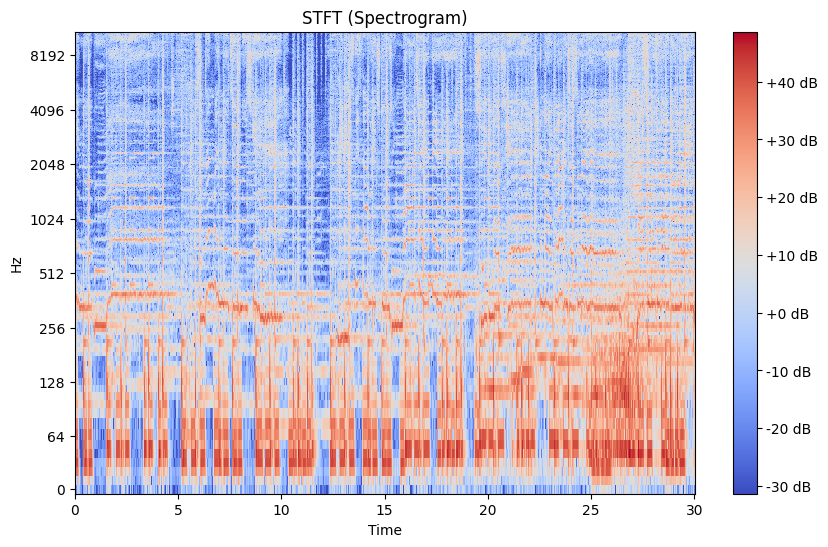

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load an audio file
audio_file = '/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav'
y, sr = librosa.load(audio_file)

# Compute the STFT
D = librosa.stft(y)

# Convert the magnitude spectrogram to decibels (dB)
D_dB = librosa.amplitude_to_db(np.abs(D))

# Plot the STFT
plt.figure(figsize=(10, 6))
librosa.display.specshow(D_dB, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('STFT (Spectrogram)')
plt.show()


# **Json File**

In [ ]:
import json

# Sample audio data
audio_data = {
    "audio_files": [
        {
            "file_name": "rock0000",
            "duration": 120,  # Duration in seconds
            "sample_rate": 44100,
            "channels": 2,
            "format": "wav",
            "metadata": {
                "artist": "John Doe",
                "title": "Sample Track 1"
            }
        },

    ]
}

# Save audio data to a JSON file
with open('audio_data.json', 'w') as json_file:
    json.dump(audio_data, json_file, indent=4)

# Load audio data from the JSON file
with open('audio_data.json', 'r') as json_file:
    loaded_audio_data = json.load(json_file)

# Accessing audio data from the loaded JSON
for audio_file in loaded_audio_data["audio_files"]:
    print(f"File Name: {audio_file['file_name']}")
    print(f"Duration: {audio_file['duration']} seconds")
    print(f"Sample Rate: {audio_file['sample_rate']} Hz")
    print(f"Channels: {audio_file['channels']}")
    print(f"Format: {audio_file['format']}")
    print(f"Artist: {audio_file['metadata']['artist']}")
    print(f"Title: {audio_file['metadata']['title']}")
    print("\n")


File Name: rock0000
Duration: 120 seconds
Sample Rate: 44100 Hz
Channels: 2
Format: wav
Artist: John Doe
Title: Sample Track 1




# **Spectogram**

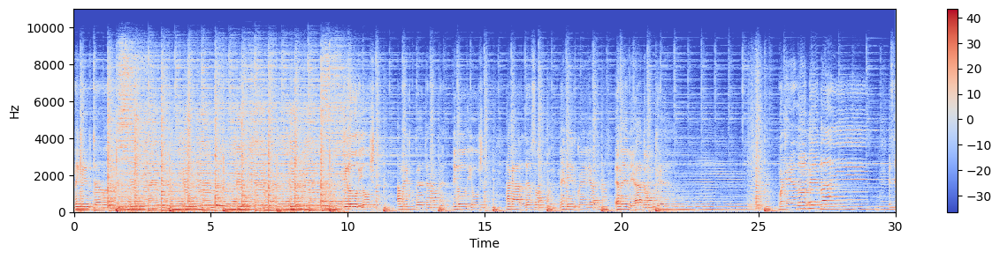

In [ ]:
x, sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav')

X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(15,3))
librosa.display.specshow(Xdb, sr=sr, x_axis='time',y_axis='hz')
plt.colorbar()

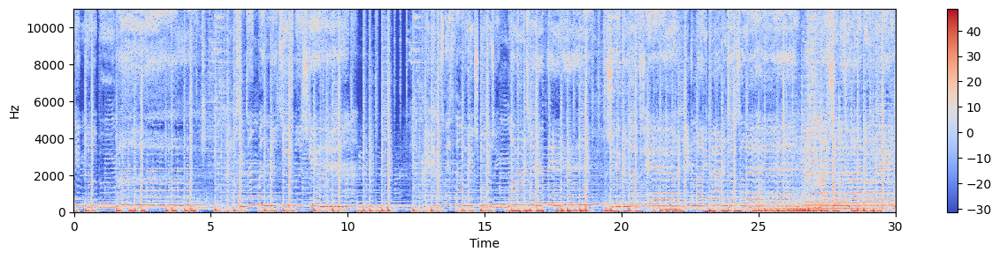

In [ ]:
x, sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav')

X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(15,3))
librosa.display.specshow(Xdb, sr=sr,x_axis='time',y_axis='hz')
plt.colorbar()

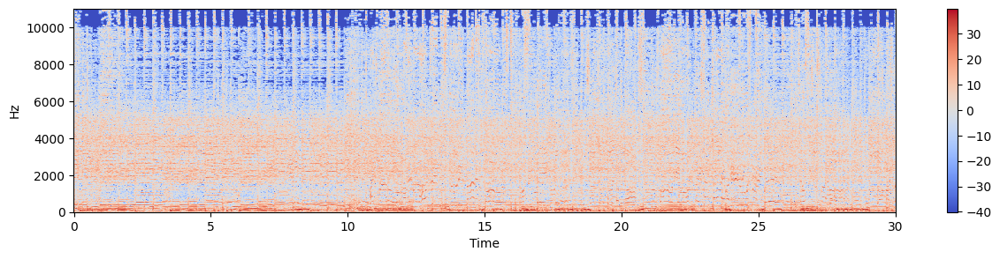

In [ ]:
x, sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/metal/metal.00000.wav')

X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(15,3))
librosa.display.specshow(Xdb, sr=sr, x_axis='time',y_axis='hz')
plt.colorbar()

# **Mel-Frequency Cepstral Coefficients (MFCCs)**

[Text(0.5, 1.0, 'Music - Warm Memories')]

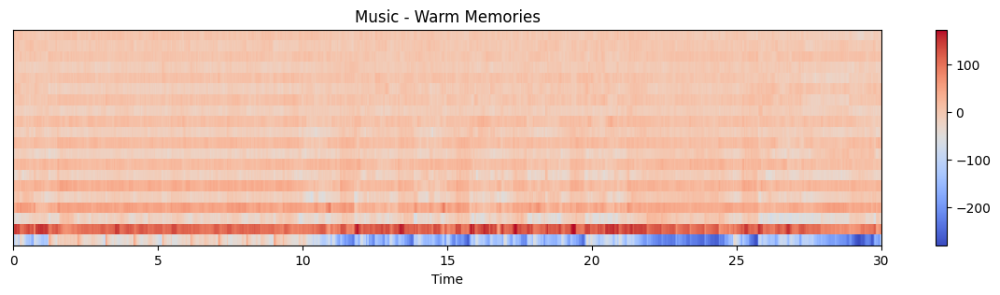

In [ ]:
x, sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav')
mfccs = librosa.feature.mfcc(y=x, sr=sr)

#show the MFCCs
fig,ax = plt.subplots(figsize=(15,3))
img = librosa.display.specshow(mfccs, sr=sr, x_axis='time')
fig.colorbar(img, ax=ax)
ax.set(title='Music - Warm Memories')

[Text(0.5, 1.0, 'Music - Warm Memories')]

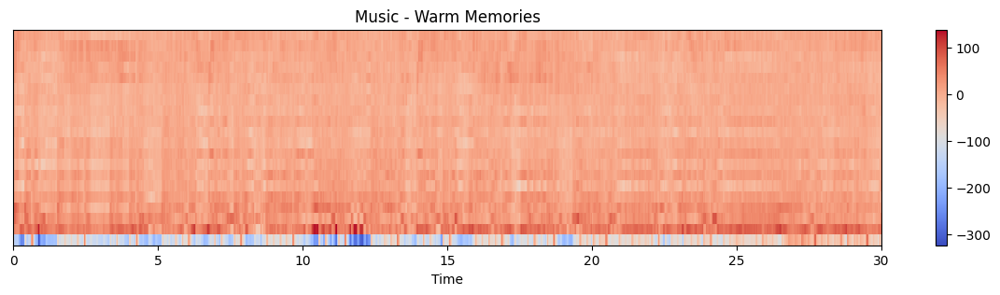

In [ ]:
x, sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav')
mfccs = librosa.feature.mfcc(y=x, sr=sr)

#show the mfcc
fig, ax = plt.subplots(figsize=(15,3))
img = librosa.display.specshow(mfccs, sr =sr, x_axis='time')
fig.colorbar(img, ax=ax)
ax.set(title='Music - Warm Memories')

[Text(0.5, 1.0, 'Music - Warm Memories')]

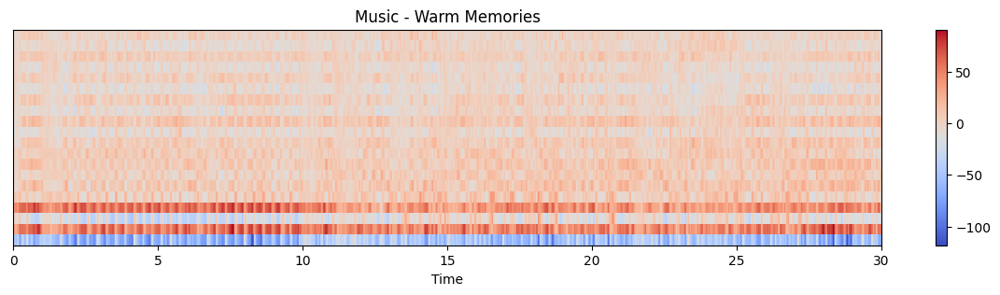

In [ ]:
x, sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/metal/metal.00000.wav')
mfccs = librosa.feature.mfcc(y=x, sr=sr)

#show the mfcc
fig, ax = plt.subplots(figsize=(15,3))
img = librosa.display.specshow(mfccs, sr =sr, x_axis='time')
fig.colorbar(img, ax=ax)
ax.set(title='Music - Warm Memories')

# **Mel-frequency spectrogram**

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

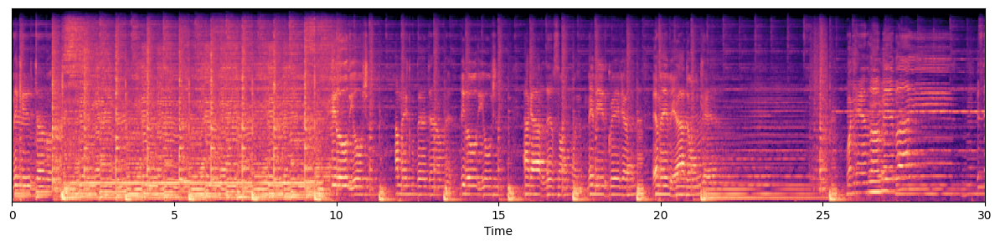

In [ ]:
y,sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav')

S = librosa.feature.melspectrogram(y=y, sr=sr)
S_db = librosa.power_to_db(S, ref=np.max)

fig.ax = plt.subplots(figsize=(15,3))
img = librosa.display.specshow(S_db, sr=sr, x_axis='time')
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

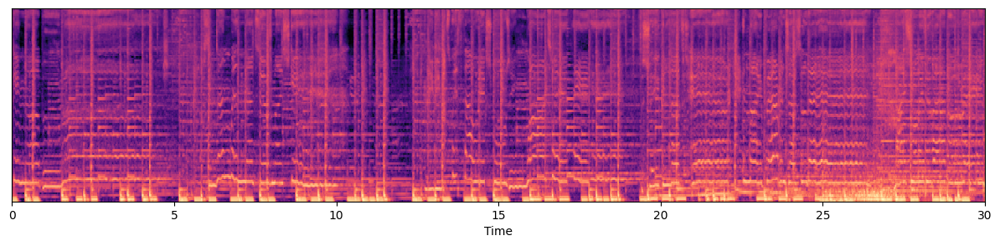

In [ ]:
y,sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/pop/pop.00000.wav')

S = librosa.feature.melspectrogram(y=y, sr=sr)
S_db = librosa.power_to_db(S, ref=np.max)

fig.ax = plt.subplots(figsize=(15,3))
img = librosa.display.specshow(S_db, sr=sr, x_axis='time')
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

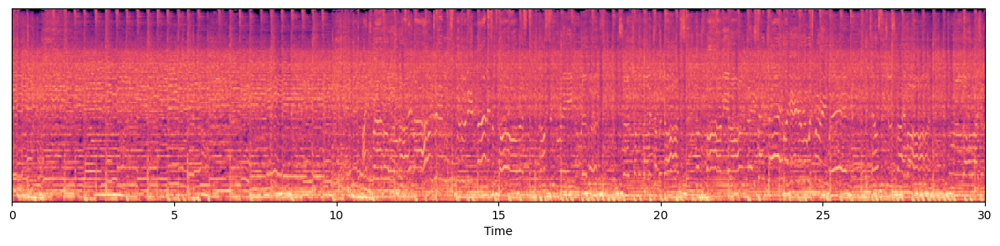

In [ ]:
y,sr = librosa.load('/content/drive/MyDrive/Dataset/Data/genres_original/metal/metal.00000.wav')

S = librosa.feature.melspectrogram(y=y, sr=sr)
S_db = librosa.power_to_db(S, ref=np.max)

fig.ax = plt.subplots(figsize=(15,3))
img = librosa.display.specshow(S_db, sr=sr, x_axis='time')
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

# Implementing a CNN for Audio Classification

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Dataset/Data/features_30_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# mount dataset folder
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    base_path = '/content/drive/MyDrive/Dataset/Data/genres_original'
else:
    base_path = ""

import os
base_path = '/content/drive/MyDrive/Dataset/Data/genres_original'
file_name = 'features_30_sec.csv'
train_test_path = os.path.join(base_path,file_name)

Mounted at /content/drive


In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.5,random_state=20)

In [ ]:
print("Number of training examples: %d"%(x_train.shape[0]))
print("Number of test examples: %d"%(x_test.shape[0]))

Number of training examples: 330752
Number of test examples: 330752


In [ ]:
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [ ]:
fname = os.path.join(train_test_path,'/content/drive/MyDrive/Dataset/Data/genres_original/rock/rock.00000.wav')

wav = wave.open(fname)
print("Sampling (frame) rate = ", wav.getframerate())
print("Total samples (frames) = ", wav.getnframes())
print("Duration = ", wav.getnframes()/wav.getframerate())

ipd.Audio(fname)

Sampling (frame) rate =  22050
Total samples (frames) =  661794
Duration =  30.013333333333332


In [ ]:
filtered_classes = ['Saxophone','Applause','Acoustic_guitar','Bark','Bass_drum','Cough','Fireworks','Laughter','Flute','Trumpet']
df_filtered = df[df["label"].isin(filtered_classes)]
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 0 non-null      object 
 1   length                   0 non-null      int64  
 2   chroma_stft_mean         0 non-null      float64
 3   chroma_stft_var          0 non-null      float64
 4   rms_mean                 0 non-null      float64
 5   rms_var                  0 non-null      float64
 6   spectral_centroid_mean   0 non-null      float64
 7   spectral_centroid_var    0 non-null      float64
 8   spectral_bandwidth_mean  0 non-null      float64
 9   spectral_bandwidth_var   0 non-null      float64
 10  rolloff_mean             0 non-null      float64
 11  rolloff_var              0 non-null      float64
 12  zero_crossing_rate_mean  0 non-null      float64
 13  zero_crossing_rate_var   0 non-null      float64
 14  harmony_mean             0 non-null   

# **Data Generator**